In [ ]:
!pip -q install faiss-gpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 227.1/227.1 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.5/85.5 MB 9.1 MB/s eta 0:00:00


In [1]:
import os
from glob import glob
from PIL import Image
import numpy as np
import faiss
# from sentence_transformers import SentenceTransformer
import matplotlib.pyplot as plt
import random
import csv
import math
import pandas as pd

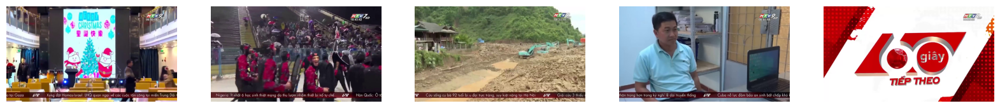

In [2]:
image_folder = "D:/AIChallenge/data_sotuyen1/keyframe/"

# Sử dụng glob để lấy tất cả các file ảnh .jpg từ các thư mục con
image_files = glob(os.path.join(image_folder, "**", "*.jpg"), recursive=True)

# Kiểm tra nếu có đủ ảnh
if len(image_files) < 5:
    print("Không đủ ảnh để hiển thị. Kiểm tra lại đường dẫn hoặc số lượng ảnh.")
else:
    # Chọn ngẫu nhiên 5 file hình ảnh
    selected_files = random.sample(image_files, 5)

    # Hiển thị hình ảnh đã chọn
    plt.figure(figsize=(20, 5))
    
    for i, file in enumerate(selected_files):
        image = Image.open(file)
        plt.subplot(1, 5, i + 1)
        plt.imshow(image)
        plt.axis("off")
    
    plt.show()

In [3]:
print(len(image_files))

1048142


In [4]:
def search_image(query, model, index, image_files, top_k=100):
    # Query có thể là ảnh hoặc text
    if query.endswith(".jpg"):
        query = Image.open(query)
        query_embedding = preprocess(query).unsqueeze(0).to(device)
        with torch.no_grad():
            query_embedding = model.encode_image(query_embedding).cpu().numpy().astype("float32").reshape(1, -1)
    else:
        # Nếu query là text
        with torch.no_grad():
            text_input = open_clip.tokenize([query]).to(device)
            query_embedding = model.encode_text(text_input).cpu().numpy().astype("float32").reshape(1, -1)

    # Thực hiện tìm kiếm với FAISS
    distances, indices = index.search(query_embedding, top_k)

    # Sắp xếp theo thứ tự của distances (khoảng cách từ nhỏ đến lớn)
    sorted_indices = indices[0][distances[0].argsort()]

    # Lấy danh sách file ảnh được truy xuất theo thứ tự đã sắp xếp
    retrieved_image_files = [image_files[i] for i in sorted_indices]
    
    return query, retrieved_image_files


In [5]:
# Hàm lấy frame_idx từ CSV hoặc từ tên file nếu là _extra
def get_frame_idx(video_name, video_id, n, map_keyframes_dir='D:/AIChallenge/data_sotuyen1/map-keyframes/'):
    if '_extra' in video_name:
        # Nếu là thư mục có đuôi _extra thì frame_idx chính là giá trị của n
        return n
    else:
        # Nếu không có _extra thì đọc từ file CSV
        csv_file_path = os.path.join(map_keyframes_dir, f'{video_name}_{video_id}.csv')
        if os.path.exists(csv_file_path):
            df = pd.read_csv(csv_file_path)
            row = df[df['n'] == int(n)]
            if not row.empty:
                return row.iloc[0]['frame_idx']
    return None

# Hàm visualize hình ảnh với tiêu đề là tên video và frame_idx
def visualize_results(query, retrieved_images, images_per_row=5, image_size=(5, 5), map_keyframes_dir='D:/AIChallenge/data_sotuyen1/map-keyframes/'):
    # Tính toán số lượng hàng cần thiết
    num_images = len(retrieved_images)
    num_rows = math.ceil(num_images / images_per_row)
    
    # Thiết lập kích thước của figure
    plt.figure(figsize=(image_size[0] * images_per_row, image_size[1] * num_rows))

    # Nếu query là ảnh
    if isinstance(query, Image.Image):
        plt.subplot(num_rows, images_per_row, 1)
        plt.imshow(query)
        plt.title("Query Image", fontsize=16)
        plt.axis('off')  # Ẩn trục
        start_idx = 2
    else:
        # Nếu query là text
        plt.subplot(num_rows, images_per_row, 1)
        plt.axis('off')  # Ẩn trục
        start_idx = 1

    # Hiển thị các hình ảnh khớp
    for i, img_path in enumerate(retrieved_images):
        # Trích xuất tên video và n từ img_path
        path_parts = img_path.split('\\')
        video_name = path_parts[-3]  # Lấy tên thư mục cha (ví dụ: L01 hoặc L01_extra)
        video_id = path_parts[-2]    # Lấy tên folder video (ví dụ: V031)
        n = os.path.splitext(os.path.basename(img_path))[0]  # Lấy tên file (ví dụ: 327 hoặc 000001)

        # Lấy frame_idx từ CSV hoặc từ tên file nếu là _extra
        frame_idx = get_frame_idx(video_name, video_id, n, map_keyframes_dir)
        
        # Hiển thị hình ảnh với tiêu đề là tên video và frame_idx
        plt.subplot(num_rows, images_per_row, i + start_idx)
        plt.imshow(Image.open(img_path))
        
        # Tạo tiêu đề cho hình ảnh theo yêu cầu
        title = f"{video_name}_{video_id} - frame_idx: {frame_idx}" if frame_idx is not None else f"{video_name}_{video_id} - frame_idx: Not found"
        plt.title(title, fontsize=12)
        plt.axis('off')  # Ẩn trục

    # Điều chỉnh khoảng cách giữa các hình ảnh
    plt.subplots_adjust(wspace=0.2, hspace=0.3)
    plt.show()

In [6]:
import torch    
import open_clip
# Load mô hình CLIP
device = "cuda" if torch.cuda.is_available() else "cpu"
model, _, preprocess = open_clip.create_model_and_transforms('ViT-B-32', device=device, pretrained='openai')

In [7]:
index = faiss.read_index("D:/AIChallenge/data_sotuyen1/faiss_clip.bin")

The scene in a classroom, the table below the classroom is decorated on the wall can clearly see 5 large flowers in the order of blue, orange, yellow, green, red. Beneath these flowers indicate class 1A*. What is the number *?


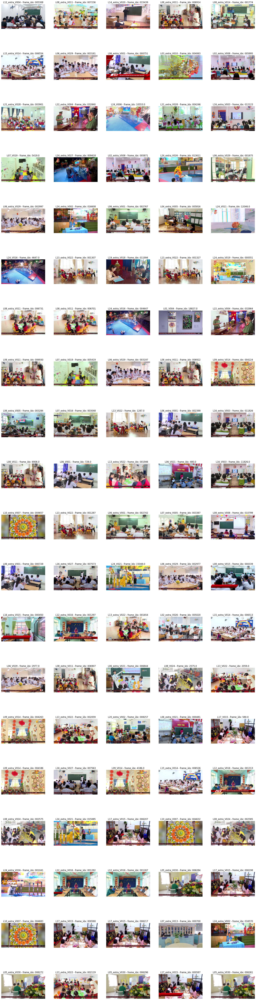

In [11]:
from translate import Translator
translator = Translator(from_lang="vi", to_lang="en")
# Tìm kiếm từ text
query = 'Khung cảnh trong một lớp học, bảng bên dưới lớp học được trang trí trên tường có thể nhìn rõ 5 bông hoa to theo thứ tự màu xanh dương, cam, vàng, xanh lá, đỏ. Bên dưới những bông hoa này cho biết lớp này là lớp 1A*. Hỏi * là số mấy?'
query = translator.translate(query)
# query = ''
print(query)
query, retrieved_image_files = search_image(query, model, index, image_files)
visualize_results(query, retrieved_image_files)